In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/tomato-village/README.md
/kaggle/input/tomato-village/Variant-c(Object Detection)/val/pascal_voc/Jodhpur_Land (54).xml
/kaggle/input/tomato-village/Variant-c(Object Detection)/val/pascal_voc/IMG20220323083054_aug2.xml
/kaggle/input/tomato-village/Variant-c(Object Detection)/val/pascal_voc/IMG20220323082710_aug6.xml
/kaggle/input/tomato-village/Variant-c(Object Detection)/val/pascal_voc/Jaipur_Pots (248)_aug7.xml
/kaggle/input/tomato-village/Variant-c(Object Detection)/val/pascal_voc/Jaipur_Pots (135)_aug2.xml
/kaggle/input/tomato-village/Variant-c(Object Detection)/val/pascal_voc/Jaipur_Pots (125)_aug2.xml
/kaggle/input/tomato-village/Variant-c(Object Detection)/val/pascal_voc/IMG20220324093132_aug4.xml
/kaggle/input/tomato-village/Variant-c(Object Detection)/val/pascal_voc/IMG20220323085203_aug7.xml
/kaggle/input/tomato-village/Variant-c(Object Detection)/val/pascal_voc/Jaipur_Pots (402)_aug1.xml
/kaggle/input/tomato-village/Variant-c(Object Detection)/val/pascal_voc/IMG

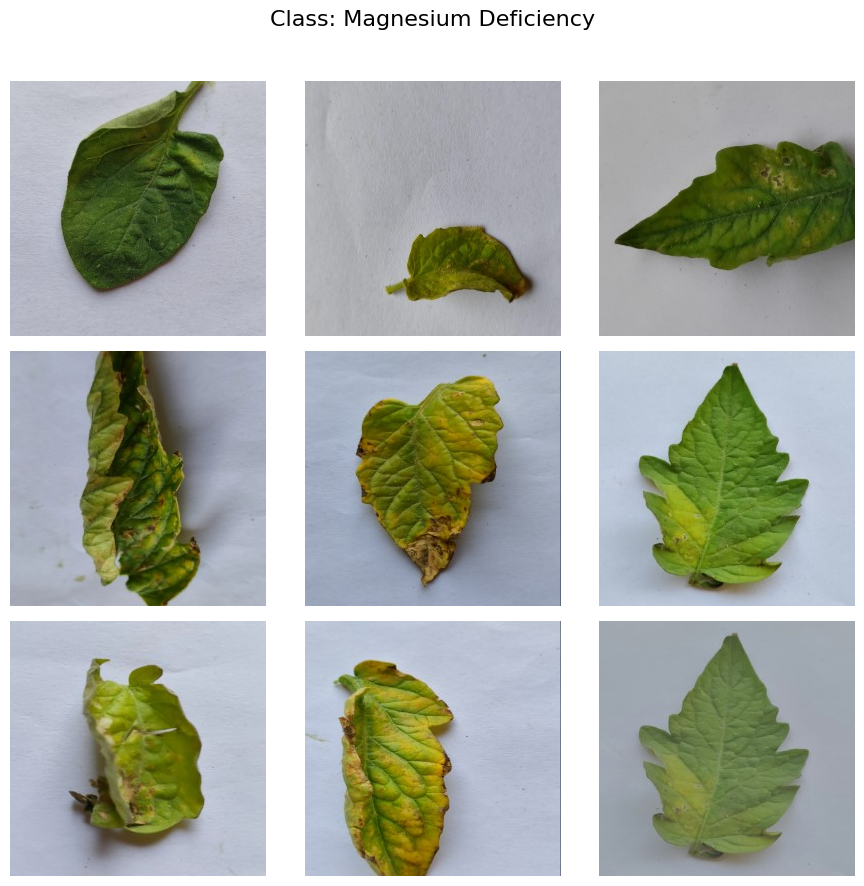

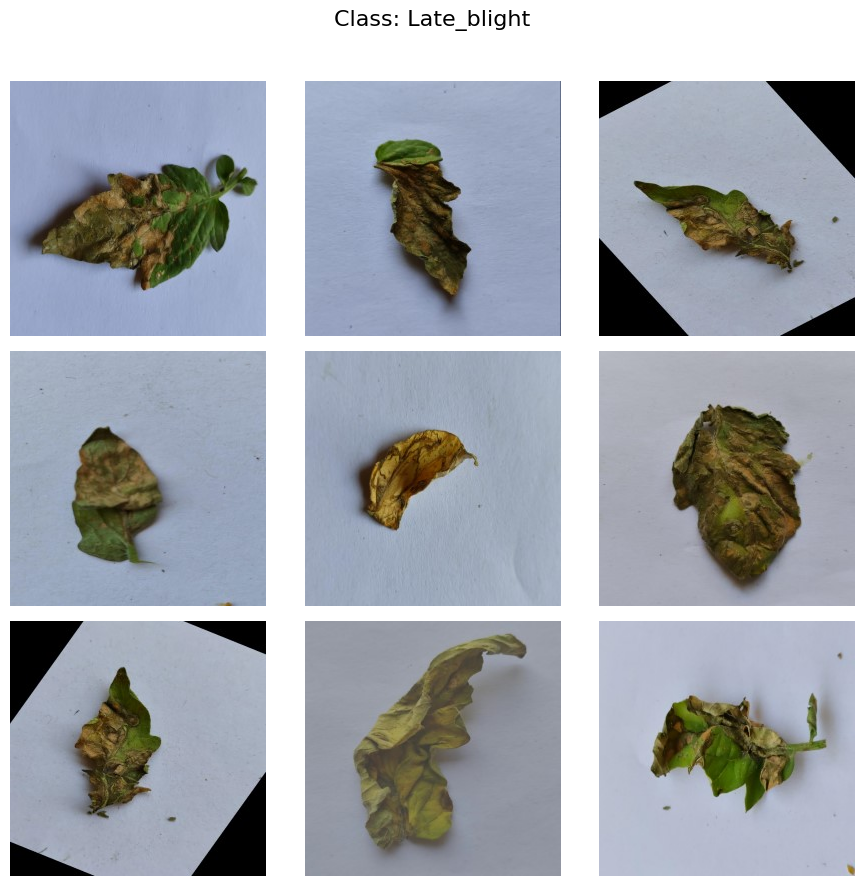

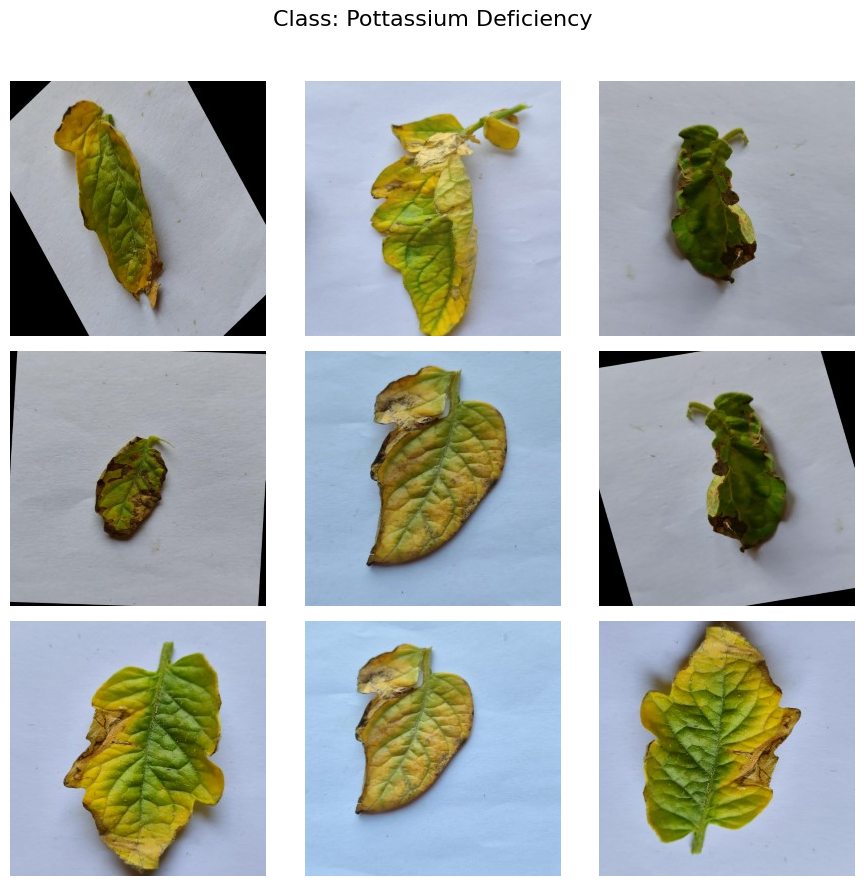

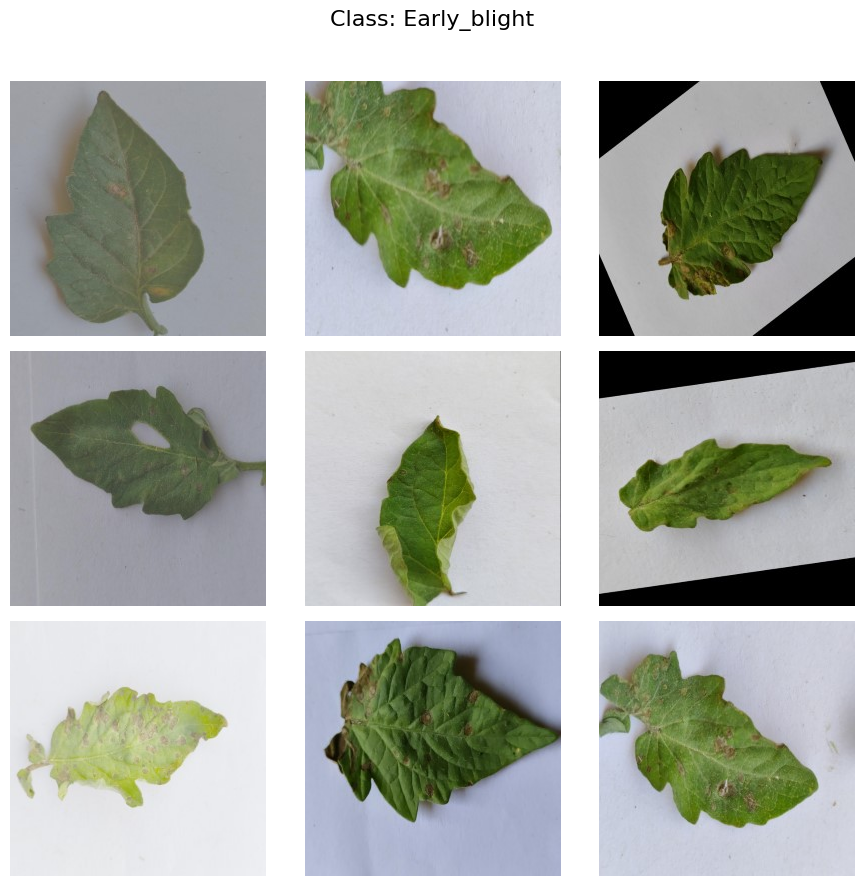

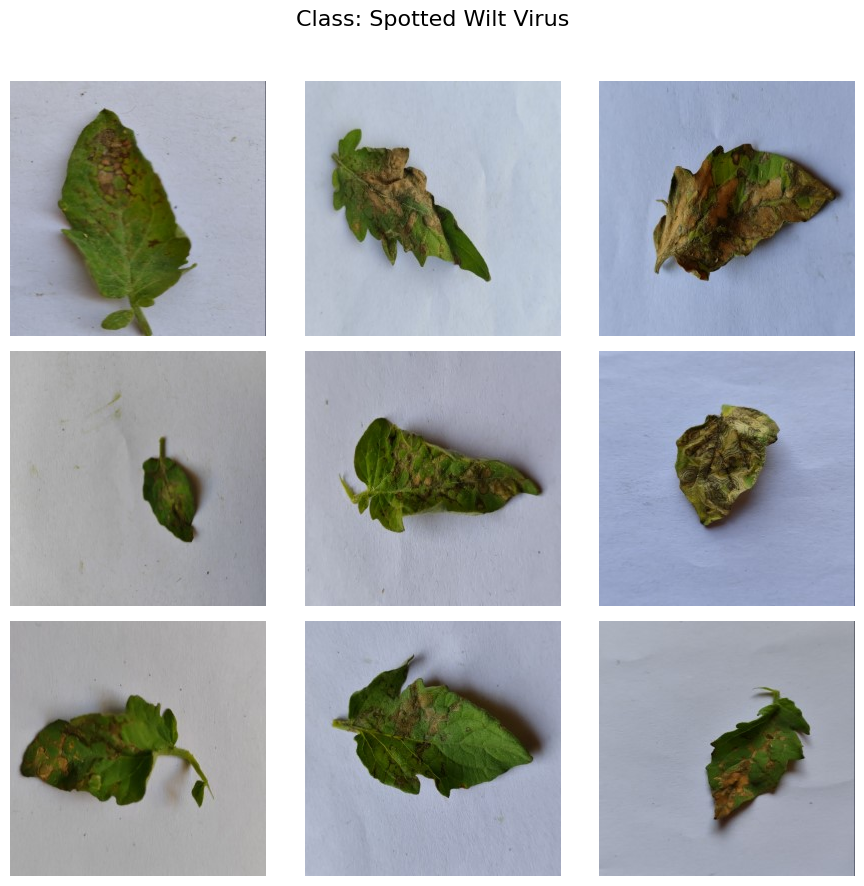

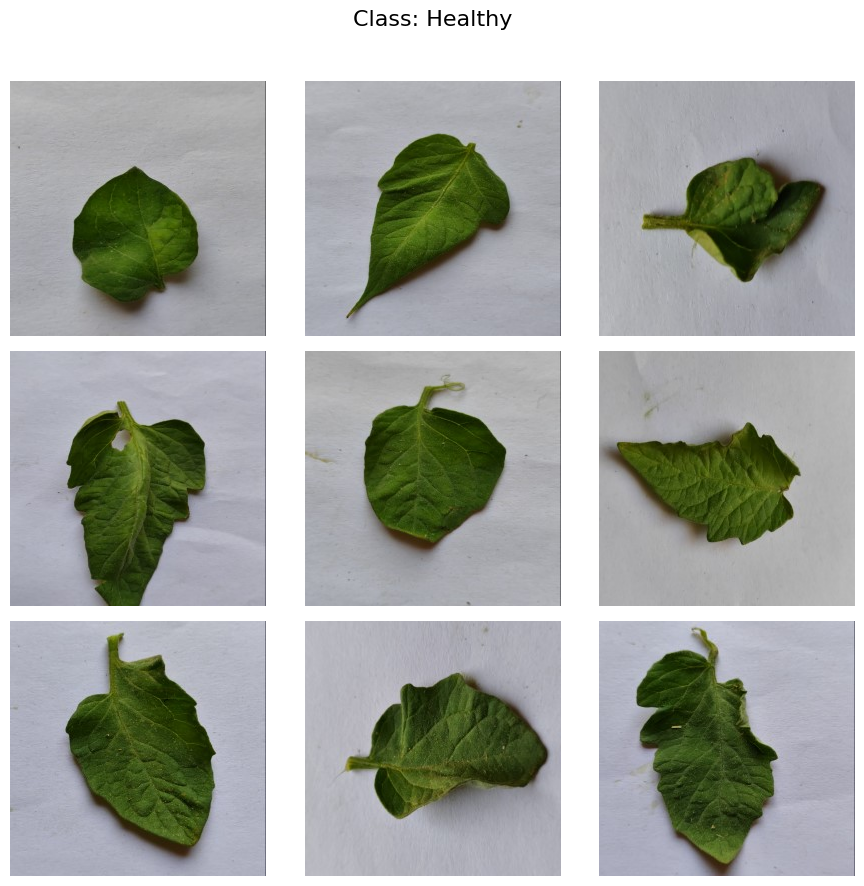

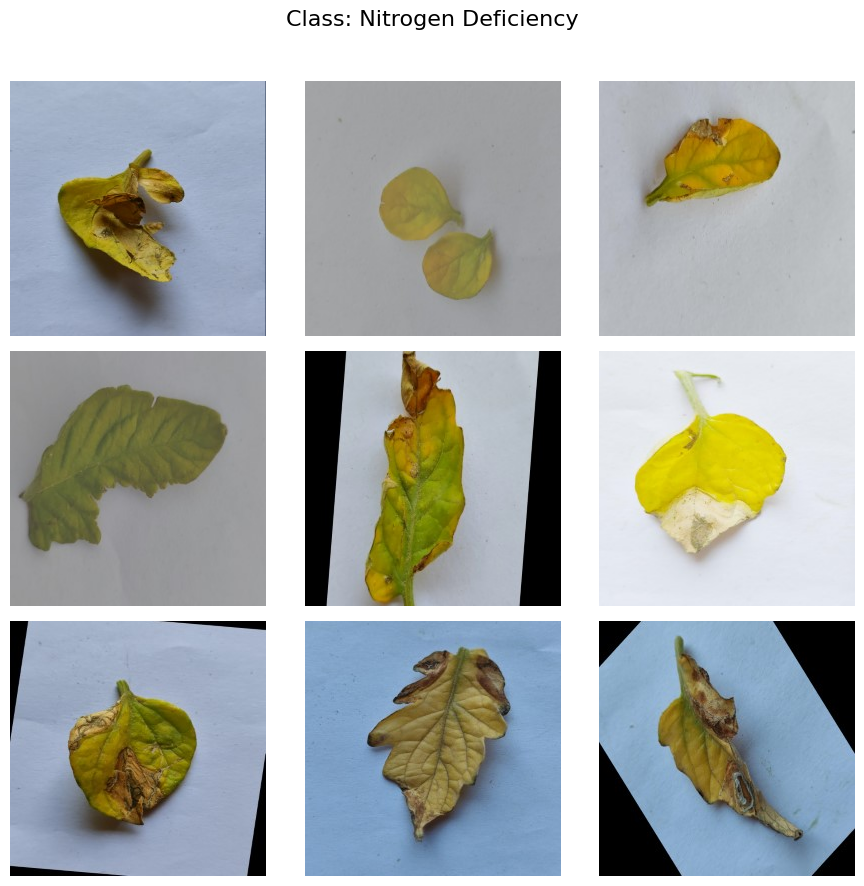

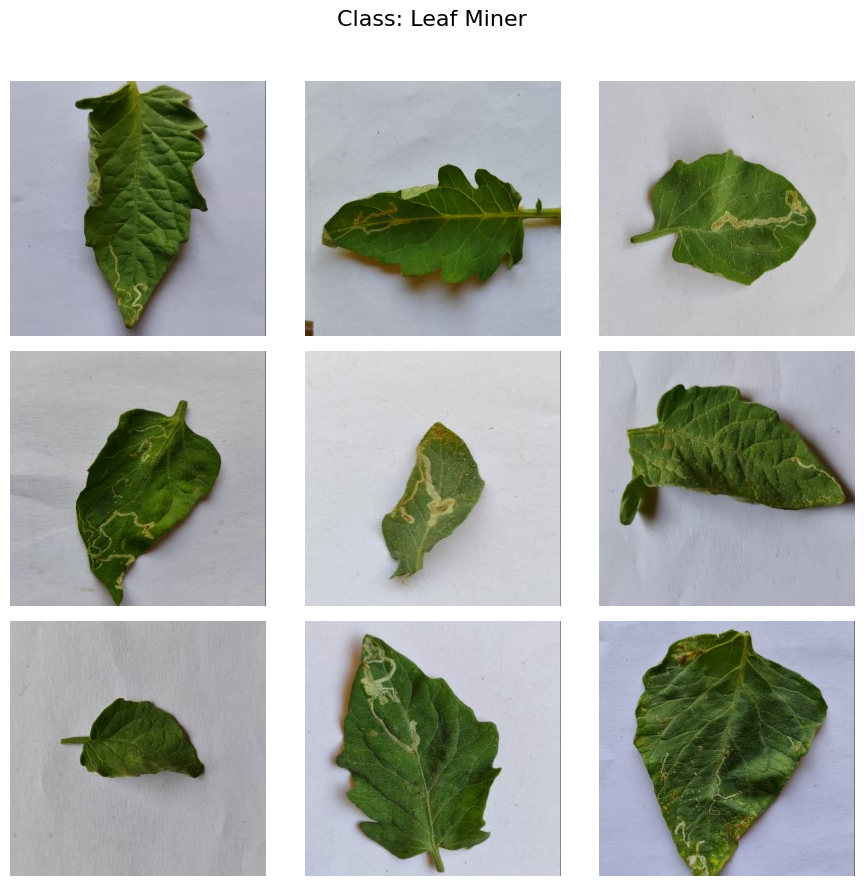

In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

base_dir = "/kaggle/input/tomato-village/Variant-a(Multiclass Classification)/train"

# Function to plot a 3x3 grid for a given class directory
def plot_class_images(class_dir, class_name):
    images = os.listdir(class_dir)[:9]  # Get first 9 images
    fig, axes = plt.subplots(3, 3, figsize=(9, 9))
    fig.suptitle(f"Class: {class_name}", fontsize=16)
    
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            img_path = os.path.join(class_dir, images[i])
            img = mpimg.imread(img_path)
            ax.imshow(img)
            ax.axis('off')
        else:
            ax.axis('off')
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

# Get class directories and plot images
class_dirs = [os.path.join(base_dir, class_dir) for class_dir in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, class_dir))]
for class_dir in class_dirs:
    class_name = os.path.basename(class_dir)
    plot_class_images(class_dir, class_name)

In [8]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, ResNet50, InceptionV3, EfficientNetB0
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Paths
train_dir = '/kaggle/input/tomato-village/Variant-a(Multiclass Classification)/train'
val_dir = '/kaggle/input/tomato-village/Variant-a(Multiclass Classification)/val'
test_dir = '/kaggle/input/tomato-village/Variant-a(Multiclass Classification)/test'

# Parameters
batch_size = 32
img_size = (224, 224)
epochs = 50

# Data Generators
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=img_size, batch_size=batch_size, class_mode='categorical')

val_generator = val_datagen.flow_from_directory(
    val_dir, target_size=img_size, batch_size=batch_size, class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
    test_dir, target_size=img_size, batch_size=batch_size, class_mode='categorical')




Found 3162 images belonging to 8 classes.
Found 902 images belonging to 8 classes.
Found 461 images belonging to 8 classes.


In [9]:
from tensorflow.keras import Input

# Custom CNN Model
def build_cnn():
    model = Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(*img_size, 3)),
        tf.keras.layers.MaxPooling2D(2, 2),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2, 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(train_generator.num_classes, activation='softmax')
    ])
    return model

# Transfer Learning Model
def build_transfer_model(base_model):
    base_model.trainable = False
    model = Sequential([
        Input(shape=(*img_size, 3)), 
        base_model,
        GlobalAveragePooling2D(),
        Dropout(0.5),
        Dense(train_generator.num_classes, activation='softmax')
    ])
    return model


In [6]:
# Compile and Train Models
def compile_and_train(model, name):
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(
        train_generator, validation_data=val_generator, epochs=epochs, verbose=1)
    # Evaluate on test data
    test_loss, test_acc = model.evaluate(test_generator, verbose=1)
    print(f'{name} - Test Accuracy: {test_acc:.2f}')
    return history, test_acc

# Models to Compare
cnn_model = build_cnn()
vgg16_model = build_transfer_model(VGG16(weights='imagenet', include_top=False, input_shape=(*img_size, 3)))
resnet50_model = build_transfer_model(ResNet50(weights='imagenet', include_top=False, input_shape=(*img_size, 3)))
inception_model = build_transfer_model(InceptionV3(weights='imagenet', include_top=False, input_shape=(*img_size, 3)))
efficientnet_model = build_transfer_model(EfficientNetB0(weights='imagenet', include_top=False, input_shape=(*img_size, 3)))

# Train and Compare
models = {
    "Custom CNN": cnn_model,
    "VGG16": vgg16_model,
    "ResNet50": resnet50_model,
    "InceptionV3": inception_model,
    "EfficientNet": efficientnet_model
}


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Training Custom CNN...
Epoch 1/20
99/99 ━━━━━━━━━━━━━━━━━━━━ 42s 374ms/step - accuracy: 0.5212 - loss: 1.3189 - val_accuracy: 0.6009 - val_loss: 1.1275
Epoch 2/20
99/99 ━━━━━━━━━━━━━━━━━━━━ 35s 329ms/step - accuracy: 0.5594 - loss: 1.2466 - val_accuracy: 0.5521 - val_loss: 1.1933
Epoch 3/20
99/99 ━━━━━━━━━━━━━━━━━━━━ 37s 351ms/step - accuracy: 0.5552 - loss: 1.2313 - val_accuracy: 0.5576 - val_loss: 1.1885
Epoch 4/20
99/99 ━━━━━━━━━━━━━━━━━━━━ 38s 355ms/step - accuracy: 0.5574 - loss: 1.2217 - val_accuracy: 0.6020 - val_loss: 1.1588
Epoch 5/20
99/99 ━━━━━━━━━━━━━━━━━━━━ 37s 346ms/step - accuracy: 0.5613 - loss: 1.2211 - val_accuracy: 0.5687 - val_loss: 1.1712
Epoch 6/20
99/99 ━━━━━━━━━━━━━━━━━━━━ 37s 349ms/step - accuracy: 0.5588 - loss: 1.2274 - val_accuracy: 0.5843 - val_loss: 1.1752
Epoch 7/20
99/99 ━━━━━━━━━━━━━━━━━━━━ 37s 347ms/step - accuracy: 0.5514 - loss: 1.2376 - val_accuracy: 0.5621 - val_loss: 1.1719
Epoch 8/20
99/99 ━━━━━━━━━━━━━━━━━━━━ 37s 344ms/step - accuracy: 0.5474 - 

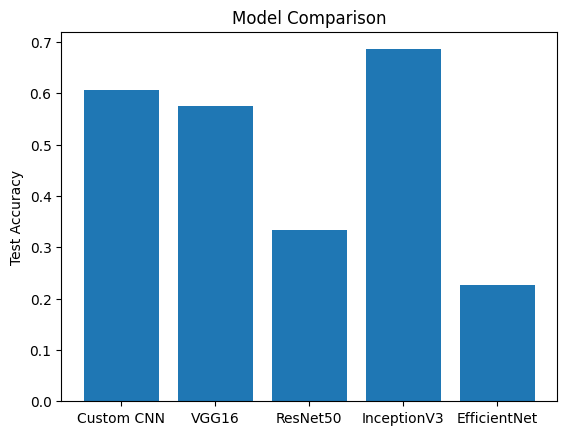

In [10]:
results = {}
for name, model in models.items():
    print(f"Training {name}...")
    history, test_acc = compile_and_train(model, name)
    results[name] = test_acc

# Compare Results
print("Final Test Accuracies:", results)

# Plotting Results
plt.bar(results.keys(), results.values())
plt.title('Model Comparison')
plt.ylabel('Test Accuracy')
plt.show()